In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wetb.gtsdf import gtsdf
import warnings
from matplotlib.cm import get_cmap
from matplotlib.ticker import FuncFormatter
from matplotlib.ticker import MultipleLocator
import math

plt.style.use("COWI")
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

# Inputs

In [48]:
# Specify location for each set of result files.
turbine_data = r"C:\Users\CRPO\OneDrive - COWI\Documents\1_Files\7_DTU\10_Final_Project\01_A_HAWC2_UMaine\power_thrust_curves"
power_curve = "power_values.csv"
thrust_curve = "thrust_values.csv"
rotor_curve_FANG = r"C:\CRPO\02_Running_area\DTU_Thesis\IEA-15-240-RWT\Documentation\operation.txt"
folder1 = "./Manual_conversion_IEA15MW/HAWC2/IEA-15-240-RWT-UMAINESEMI/res" # always a manual model
folder2 = "./WINDIO_conversion_IEA15MW_v02/IEA15MW_Floating_v02/res" #always windio model
figure_directory = "0_Figures/20250307_WindIO_v02"

# Functions

In [3]:

def create_directory(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

In [4]:
def find_hdf5_files(base_dir):
    """Find all .hdf5 files in the 'res' subdirectory of a given folder."""
    hdf5_files = []
    for root, _, files in os.walk(base_dir):
        if 'res' in root:  # Ensure we're in a 'res' subdirectory
            for file in files:
                if file.endswith('.hdf5'):
                    hdf5_files.append(os.path.join(root, file))
    return hdf5_files

In [5]:
def add_attributes(results, file_path, key):
    """Load attributes and map descriptions to names."""
    time, data, info = gtsdf.load(file_path)
    
    # Map descriptions to attribute names and units
    attr_mapping = {
        info['attribute_descriptions'][i]: {
            'name': info['attribute_names'][i],
            'unit': info['attribute_units'][i]
        } for i in range(len(info['attribute_names']))
    }

    new_columns = pd.MultiIndex.from_tuples(
        [(key, attr_mapping[desc]['name'], desc, attr_mapping[desc]['unit']) for desc in attr_mapping],
        names=["file", "attribute_name", "attribute_description", "unit"]
    )
    results[key] = pd.DataFrame(data, columns=new_columns, index=pd.Index(time, name="time"))

    return attr_mapping

In [6]:
def list_attribute_descriptions(attr_mapping):
    """Return a list of all attribute descriptions."""
    return list(attr_mapping.keys())

In [7]:
def get_attributes_by_description(attr_mapping, descriptions):
    """Retrieve attribute names based on a list of descriptions."""
    return [attr_mapping[desc]['name'] for desc in descriptions if desc in attr_mapping]

In [8]:
def parse_filename_for_filter(file_name):
    """Extract prefix and wind speed from the file name."""
    parts = file_name.split("_")
    prefix = "_".join(parts[:3])  # First three components as prefix

    # Extract wind speed by looking for a part ending with 'ms'
    wind_speed = None
    for part in parts:
        if "ms" in part:
            try:
                wind_speed = float(part.split("ms")[0])  # Extract numeric part before 'ms'
                break
            except ValueError:
                continue  # If conversion fails, skip to next part

    return prefix, wind_speed

In [9]:
def format_yaxis(x, pos):
    return f"{x:.5g}"  # Format to one significant figure

In [21]:
def plot_attributes_comparison3(results1, results2, descriptions, attr_mapping1, attr_mapping2, prefix, wind_speeds, ncols,time_range=None, plt_label ="string",font_size=15,
                               dim = (5,4), linestyles = ("-","--"), linewidths = (1, 1), linealphas = (1,1), consistent_colors = False, save = False):
    """
    Plot selected attributes from two result sources in a subplot configuration.

    Parameters:
        results1, results2: Dictionaries of DataFrames for source 1 and source 2.
        descriptions: Dictionary where the key is the attribute name and the value specifies
                      - A single string if the attribute description is the same in both sources.
                      - A list or tuple with two strings if the descriptions differ (source1, source2).
        attr_mappings: Dictionary containing attribute mappings for both sources.
        prefix: Prefix to filter files for plotting.
        wind_speeds: List of wind speeds to filter, or None to include all wind speeds.
        ncols: Number of columns in the subplot grid.
        time_range: Tuple (start_time, end_time) for zooming into a specific time range, or None for full time series.
        dim: Tuple (width per ncol, height per nrow). Default value is 5 width, 4 height
        linestyles: Tuple (source1, source2). Default value is ("-","--")
        linewidths: Tuple (source1, source2). Default value is (1,1)
        save: True to save figure. Default is false.
    """
    plt.rcParams.update({'font.size':font_size})
    heave_desc = ['State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos']
    radian_desc = ['ESYS floater SENSOR            4','ESYS floater SENSOR            5']
    opposite_sign = ['roty','ESYS floater SENSOR            1']
    adj_deg = ['ESYS floater SENSOR            6','absolute Rotation global Ry Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def']
    # Prepare consistent colors for wind speeds
    if consistent_colors:
        cmap = get_cmap("tab20")  # Use a colormap for unique colors
        wind_speed_colors = {ws: cmap(i) for i, ws in enumerate(sorted(wind_speeds))}
    
    nrows = -(-len(descriptions) // ncols)  # Calculate rows required
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(dim[0] * ncols, dim[1] * nrows))
    axes = axes.flatten() if nrows * ncols > 1 else [axes]

    for i, (attr_label, desc_info) in enumerate(descriptions.items()):
        if i >= len(axes):
            break

        # Determine attribute descriptions for source1 and source2
        if isinstance(desc_info, (list, tuple)):
            if len(desc_info) == 2:
                desc1, desc2 = desc_info
                offset1, offset2 = 0, 0  # Default offsets
            elif len(desc_info) == 4:
                desc1, offset1, desc2, offset2 = desc_info  # Descriptions and offsets
            else:
                raise ValueError(f"Invalid description format for {attr_label}: {desc_info}")
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc_info}")

        ax = axes[i]

        for key1 in results1:
            key_prefix, key_wind_speed = parse_filename_for_filter(key1)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):
                attr_name1 = attr_mapping1[key1][desc1]['name']
                unit1 = attr_mapping1[key1][desc1]['unit']
                column_name = (key1, attr_name1, desc1, unit1)
                
                if column_name in results1[key1].columns:                    
                    data_to_plot = results1[key1]
                    if time_range:
                        data_to_plot = results1[key1].loc[time_range[0]:time_range[1]]  # Apply time range
                    color = wind_speed_colors[key_wind_speed] if consistent_colors else None
                    if column_name[2] in radian_desc:
                        y_val = np.degrees(data_to_plot[column_name]) - offset1
                    elif column_name[2] in adj_deg:
                        y_val = np.degrees(data_to_plot[column_name]) - 180 - offset1
                    elif column_name[2] in opposite_sign:
                        y_val = data_to_plot[column_name]*-1   
                    else:
                        y_val = data_to_plot[column_name] - offset1
                    ax.plot(data_to_plot.index, y_val,linestyle=linestyles[0], linewidth = linewidths[0], 
                            label=f"Baseline: {plt_label} - Vy {key_wind_speed} [m/s])",
                            color = color, alpha = linealphas[0])

        for key2 in results2:
            key_prefix, key_wind_speed = parse_filename_for_filter(key2)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):
                attr_name2 = attr_mapping2[key2][desc2]['name']
                unit2 = attr_mapping2[key2][desc2]['unit']
                column_name = (key2, attr_name2, desc2, unit2)
                #print(key2, attr_name2, desc2, unit2)
                if column_name in results2[key2].columns:
                    data_to_plot = results2[key2]
                    if time_range:
                        data_to_plot = results2[key2].loc[time_range[0]:time_range[1]]  # Apply time range
                    color = wind_speed_colors[key_wind_speed] if consistent_colors else None
                    #print(column_name[2])
                    
                    if column_name[2] in heave_desc:
                        y_val = (data_to_plot[column_name] - 20)
                    elif column_name[2] in opposite_sign:
                        y_val = data_to_plot[column_name]*-1
                    elif column_name[2] in adj_deg:
                        y_val = (data_to_plot[column_name] - 180)*-1
                    else:
                        y_val =  data_to_plot[column_name]
                    ax.plot(data_to_plot.index, y_val, linestyle=linestyles[1], linewidth = linewidths[1],
                            label=f"WINDIO: {plt_label} - Vy {key_wind_speed} [m/s])",
                            color = color, alpha = linealphas[1])

        
        if unit1 != "N/A":
            ax.set_title(f"Attribute: {attr_label} [{unit1}]")
        else:
            ax.set_title(f"Attribute: {attr_label}")
        #ax.set_xlabel("Time [s]")
        # Only set x-axis labels on the bottom row
        for i, ax in enumerate(axes):
            if i >= (nrows - 1) * ncols:  # Bottom row
                ax.set_xlabel("Time [s]")
            else:
                ax.set_xlabel("")
        ax.yaxis.set_major_formatter(FuncFormatter(format_yaxis))
        #ax.set_ylabel(unit1 if unit1 == unit2 else f"Unit Mismatch: {unit1}/{unit2}")
        #ax.legend()
    handles, labels = axes[0].get_legend_handles_labels()  # Get legend info from the first plot
    fig.legend(handles, labels, loc='upper center', ncol=2, fontsize=font_size)
    # Hide unused axes
    for ax in axes[len(descriptions):]:
        ax.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.92])
    if save:
        create_directory(figure_directory)
        wind_speed_str = "_".join(map(str, wind_speeds))
        filename = (f"{prefix}_{attr_label}_{wind_speed_str}ms.png")
        plt.savefig(os.path.join(figure_directory,filename))
    plt.show()

In [11]:
def plot_attributes_comparison2(results1, results2, descriptions, attr_mapping1, attr_mapping2, prefix, wind_speeds, ncols,time_range=None, plt_label ="string",font_size=15,
                               dim = (5,4), linestyles = ("-","--"), linewidths = (1, 1), linealphas = (1,1), consistent_colors = False, save = False):
    """
    Plot selected attributes from two result sources in a subplot configuration.

    Parameters:
        results1, results2: Dictionaries of DataFrames for source 1 and source 2.
        descriptions: Dictionary where the key is the attribute name and the value specifies
                      - A single string if the attribute description is the same in both sources.
                      - A list or tuple with two strings if the descriptions differ (source1, source2).
        attr_mappings: Dictionary containing attribute mappings for both sources.
        prefix: Prefix to filter files for plotting.
        wind_speeds: List of wind speeds to filter, or None to include all wind speeds.
        ncols: Number of columns in the subplot grid.
        time_range: Tuple (start_time, end_time) for zooming into a specific time range, or None for full time series.
        dim: Tuple (width per ncol, height per nrow). Default value is 5 width, 4 height
        linestyles: Tuple (source1, source2). Default value is ("-","--")
        linewidths: Tuple (source1, source2). Default value is (1,1)
        save: True to save figure. Default is false.
    """
    plt.rcParams.update({'font.size':font_size})
    heave_desc = ['State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos','absolute Deflection global Dz Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def']
    radian_desc = ['ESYS floater SENSOR            4','ESYS floater SENSOR            5']
    pos_desc = ['State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos','absolute Deflection global Dy Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def']
    adj_deg = ['ESYS floater SENSOR            6','absolute Rotation global Ry Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def']
    # Prepare consistent colors for wind speeds
    if consistent_colors:
        cmap = get_cmap("tab20")  # Use a colormap for unique colors
        wind_speed_colors = {ws: cmap(i) for i, ws in enumerate(sorted(wind_speeds))}
    
    nrows = -(-len(descriptions) // ncols)  # Calculate rows required
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(dim[0] * ncols, dim[1] * nrows))
    axes = axes.flatten() if nrows * ncols > 1 else [axes]

    for i, (attr_label, desc_info) in enumerate(descriptions.items()):
        if i >= len(axes):
            break

        # Determine attribute descriptions for source1 and source2
        if isinstance(desc_info, (list, tuple)):
            if len(desc_info) == 2:
                desc1, desc2 = desc_info
                offset1, offset2 = 0, 0  # Default offsets
            elif len(desc_info) == 4:
                desc1, offset1, desc2, offset2 = desc_info  # Descriptions and offsets
            else:
                raise ValueError(f"Invalid description format for {attr_label}: {desc_info}")
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc_info}")

        ax = axes[i]

        for key1 in results1:
            key_prefix, key_wind_speed = parse_filename_for_filter(key1)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):
                attr_name1 = attr_mapping1[key1][desc1]['name']
                unit1 = attr_mapping1[key1][desc1]['unit']
                column_name = (key1, attr_name1, desc1, unit1)
                if column_name in results1[key1].columns:                    
                    data_to_plot = results1[key1]
                    if time_range:
                        data_to_plot = results1[key1].loc[time_range[0]:time_range[1]]  # Apply time range
                    color = wind_speed_colors[key_wind_speed] if consistent_colors else None
                    if column_name[2] in radian_desc:
                        y_val = np.degrees(data_to_plot[column_name]) - offset1
                    elif column_name[2] in adj_deg:
                        y_val = np.degrees(data_to_plot[column_name]) - 180 - offset1
                    else:
                        y_val = data_to_plot[column_name] - offset1
                    ax.plot(data_to_plot.index, y_val,linestyle=linestyles[0], linewidth = linewidths[0], 
                            label=f"Manual: {plt_label} - Vy {key_wind_speed} [m/s])",
                            color = color, alpha = linealphas[0])

        for key2 in results2:
            key_prefix, key_wind_speed = parse_filename_for_filter(key2)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):
                attr_name2 = attr_mapping2[key2][desc2]['name']
                unit2 = attr_mapping2[key2][desc2]['unit']
                column_name = (key2, attr_name2, desc2, unit2)
                if column_name in results2[key2].columns:
                    data_to_plot = results2[key2]
                    if time_range:
                        data_to_plot = results2[key2].loc[time_range[0]:time_range[1]]  # Apply time range
                    color = wind_speed_colors[key_wind_speed] if consistent_colors else None
                    #print(column_name[2])
                    if column_name[2] in pos_desc:
                        y_val = -1*(data_to_plot[column_name] - offset2)
                    elif column_name[2] in adj_deg:
                        y_val = data_to_plot[column_name] - 180 - offset2
                    else:
                        y_val =  data_to_plot[column_name] - offset2
                    ax.plot(data_to_plot.index, y_val, linestyle=linestyles[1], linewidth = linewidths[1],
                            label=f"WINDIO: {plt_label} - Vy {key_wind_speed} [m/s])",
                            color = color, alpha = linealphas[1])

        
        if unit1 != "N/A":
            ax.set_title(f"Attribute: {attr_label} [{unit1}]")
        else:
            ax.set_title(f"Attribute: {attr_label}")
        #ax.set_xlabel("Time [s]")
        # Only set x-axis labels on the bottom row
        for i, ax in enumerate(axes):
            if i >= (nrows - 1) * ncols:  # Bottom row
                ax.set_xlabel("Time [s]")
            else:
                ax.set_xlabel("")
        ax.yaxis.set_major_formatter(FuncFormatter(format_yaxis))
        #ax.set_ylabel(unit1 if unit1 == unit2 else f"Unit Mismatch: {unit1}/{unit2}")
        #ax.legend()
    handles, labels = axes[0].get_legend_handles_labels()  # Get legend info from the first plot
    fig.legend(handles, labels, loc='upper center', ncol=2, fontsize=font_size)
    # Hide unused axes
    for ax in axes[len(descriptions):]:
        ax.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.92])
    if save:
        create_directory(figure_directory)
        wind_speed_str = "_".join(map(str, wind_speeds))
        filename = (f"{prefix}_{attr_label}_{wind_speed_str}ms.png")
        plt.savefig(os.path.join(figure_directory,filename))
    plt.show()

In [22]:
def plot_attributes_comparison(results1, results2, descriptions, attr_mapping1, attr_mapping2, prefix, wind_speeds, ncols,time_range=None, plt_label ="string",font_size=15,
                               dim = (5,4), linestyles = ("-","--"), linewidths = (1, 1), linealphas = (1,1), consistent_colors = False, save = False):
    """
    Plot selected attributes from two result sources in a subplot configuration.

    Parameters:
        results1, results2: Dictionaries of DataFrames for source 1 and source 2.
        descriptions: Dictionary where the key is the attribute name and the value specifies
                      - A single string if the attribute description is the same in both sources.
                      - A list or tuple with two strings if the descriptions differ (source1, source2).
        attr_mappings: Dictionary containing attribute mappings for both sources.
        prefix: Prefix to filter files for plotting.
        wind_speeds: List of wind speeds to filter, or None to include all wind speeds.
        ncols: Number of columns in the subplot grid.
        time_range: Tuple (start_time, end_time) for zooming into a specific time range, or None for full time series.
        dim: Tuple (width per ncol, height per nrow). Default value is 5 width, 4 height
        linestyles: Tuple (source1, source2). Default value is ("-","--")
        linewidths: Tuple (source1, source2). Default value is (1,1)
        save: True to save figure. Default is false.
    """
    plt.rcParams.update({'font.size':font_size})
    heave_desc = ['State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos','absolute Deflection global Dz Mbdy:main_column s=   0.00[m] s/S=   0.00 coo: global center:c2def']
    radian_desc = ['ESYS floater SENSOR            4','ESYS floater SENSOR            5','ESYS floater SENSOR            6']
    pos_desc = ['State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos','absolute Deflection global Dy Mbdy:main_column s=   0.00[m] s/S=   0.00 coo: global center:c2def']
    # Prepare consistent colors for wind speeds
    if consistent_colors:
        cmap = get_cmap("tab20")  # Use a colormap for unique colors
        wind_speed_colors = {ws: cmap(i) for i, ws in enumerate(sorted(wind_speeds))}
    
    nrows = -(-len(descriptions) // ncols)  # Calculate rows required
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(dim[0] * ncols, dim[1] * nrows))
    axes = axes.flatten() if nrows * ncols > 1 else [axes]

    for i, (attr_label, desc) in enumerate(descriptions.items()):
        if i >= len(axes):
            break

        # Determine attribute descriptions for source1 and source2
        if isinstance(desc, str):
            desc1, desc2 = desc, desc  # Same description for both sources
        elif isinstance(desc, (list, tuple)) and len(desc) == 2:
            desc1, desc2 = desc  # Different descriptions for each source
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc}")

        ax = axes[i]

        for key1 in results1:
            key_prefix, key_wind_speed = parse_filename_for_filter(key1)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):
                attr_name1 = attr_mapping1[key1][desc1]['name']
                unit1 = attr_mapping1[key1][desc1]['unit']
                column_name = (key1, attr_name1, desc1, unit1)
                if column_name in results1[key1].columns:                    
                    data_to_plot = results1[key1]
                    if time_range:
                        data_to_plot = results1[key1].loc[time_range[0]:time_range[1]]  # Apply time range
                    color = wind_speed_colors[key_wind_speed] if consistent_colors else None
                    if column_name[2] in radian_desc:
                        y_val = np.degrees(data_to_plot[column_name])
                    else:
                        y_val = data_to_plot[column_name]
                    ax.plot(data_to_plot.index, y_val,linestyle=linestyles[0], linewidth = linewidths[0], 
                            label=f"Baseline: {plt_label} - Vy {key_wind_speed} [m/s])",
                            color = color, alpha = linealphas[0])

        for key2 in results2:
            key_prefix, key_wind_speed = parse_filename_for_filter(key2)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):
                attr_name2 = attr_mapping2[key2][desc2]['name']
                unit2 = attr_mapping2[key2][desc2]['unit']
                column_name = (key2, attr_name2, desc2, unit2)
                if column_name in results2[key2].columns:
                    data_to_plot = results2[key2]
                    if time_range:
                        data_to_plot = results2[key2].loc[time_range[0]:time_range[1]]  # Apply time range
                    color = wind_speed_colors[key_wind_speed] if consistent_colors else None
                    if column_name[2] in pos_desc:
                        y_val = -1*data_to_plot[column_name]
                    elif column_name[2] in heave_desc:
                        y_val = data_to_plot[column_name]-20
                    else:
                        y_val = data_to_plot[column_name]
                    ax.plot(data_to_plot.index, y_val, linestyle=linestyles[1], linewidth = linewidths[1],
                            label=f"WINDIO: {plt_label} - Vy {key_wind_speed} [m/s])",
                            color = color, alpha = linealphas[1])

        if unit1 != "N/A":
            ax.set_title(f"Attribute: {attr_label} [{unit1}]")
        else:
            ax.set_title(f"Attribute: {attr_label}")
        #ax.set_xlabel("Time [s]")
        for i, ax in enumerate(axes):
            if i >= (nrows - 1) * ncols:  # Bottom row
                ax.set_xlabel("Time [s]")
            else:
                ax.set_xlabel("")
        ax.yaxis.set_major_formatter(FuncFormatter(format_yaxis))
        #ax.set_ylabel(unit1 if unit1 == unit2 else f"Unit Mismatch: {unit1}/{unit2}")
        #ax.legend()
    handles, labels = axes[0].get_legend_handles_labels()  # Get legend info from the first plot
    fig.legend(handles, labels, loc='upper center', ncol=2, fontsize=font_size)
    # Hide unused axes
    for ax in axes[len(descriptions):]:
        ax.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.92])
    if save:
        create_directory(figure_directory)
        wind_speed_str = "_".join(map(str, wind_speeds))
        filename = (f"{prefix}_{attr_label}_{wind_speed_str}ms.png")
        plt.savefig(os.path.join(figure_directory,filename))
    plt.show()

In [13]:
def results_table_diff2(
    results1, 
    results2, 
    descriptions, 
    attr_mapping1, 
    attr_mapping2, 
    prefix, 
    wind_speeds, 
    time_range=None, 
    sigfigs=3, 
    epsilon=1e-6
):
    def round_to_sigfigs(x, sigfigs):
        if pd.isnull(x) or x == 0:
            return x  # Return as is if NaN or 0
        return round(x, -int(np.floor(np.log10(abs(x))) - (sigfigs - 1)))

    # Create a DataFrame with multi-index columns for magnitude and percentage
    columns = pd.MultiIndex.from_product([
        wind_speeds, ["Magnitude", "Percentage"]
    ], names=["Wind Speed", "Metric"])

    avg_diff_df = pd.DataFrame(index=descriptions.keys(), columns=columns)
    avg_diff_df.insert(0, "Units", "")

    for attr_label, desc in descriptions.items():
        # Determine attribute descriptions for source1 and source2
        if isinstance(desc, str):
            desc1, desc2 = desc, desc  # Same description for both sources
        elif isinstance(desc, (list, tuple)) and len(desc) == 2:
            desc1, desc2 = desc  # Different descriptions for each source
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc}")

        # Add unit for the attribute
        for key1 in results1:
            if desc1 in attr_mapping1[key1]:
                unit = attr_mapping1[key1][desc1]['unit']
                avg_diff_df.loc[attr_label, ('Units', '')] = unit
                break  # Stop once the unit is found

        for wind_speed in wind_speeds:
            magnitude_diffs = []  # Reset magnitude differences for each wind speed
            percentage_diffs = []  # Reset percentage differences for each wind speed

            for key1 in results1:
                key_prefix, key_wind_speed = parse_filename_for_filter(key1)
                if key_prefix == prefix and key_wind_speed == wind_speed:
                    attr_name1 = attr_mapping1[key1][desc1]['name']
                    unit1 = attr_mapping1[key1][desc1]['unit']
                    column_name = (key1, attr_name1, desc1, unit1)

                    if column_name in results1[key1].columns:
                        data1 = results1[key1]
                        if time_range:
                            data1 = data1.loc[time_range[0]:time_range[1]]  # Apply time range

                        for key2 in results2:
                            key_prefix2, key_wind_speed2 = parse_filename_for_filter(key2)
                            if key_prefix2 == prefix and key_wind_speed2 == wind_speed:
                                attr_name2 = attr_mapping2[key2][desc2]['name']
                                column_name2 = (key2, attr_name2, desc2, attr_mapping2[key2][desc2]['unit'])

                                if column_name2 in results2[key2].columns:
                                    data2 = results2[key2]
                                    if time_range:
                                        data2 = data2.loc[time_range[0]:time_range[1]]  # Apply time range

                                    # Compute differences
                                    common_index = data1.index.intersection(data2.index)
                                    ref_values = data1.loc[common_index, column_name]
                                    comparison_values = data2.loc[common_index, column_name2]

                                    # Set to NaN if either value is below the epsilon threshold
                                    valid_mask = (np.abs(ref_values) >= epsilon) & (np.abs(comparison_values) >= epsilon)
                                    valid_ref_values = ref_values[valid_mask]
                                    valid_comparison_values = comparison_values[valid_mask]

                                    if len(valid_ref_values) > 0:
                                        magnitude_diff = (valid_ref_values - valid_comparison_values).abs()
                                        percentage_diff = magnitude_diff / valid_ref_values 
                                        magnitude_diffs.extend(magnitude_diff)
                                        percentage_diffs.extend(percentage_diff)

            # Compute the average difference in magnitude and percentage for the current attribute and wind speed
            if magnitude_diffs and percentage_diffs:
                avg_magnitude_diff = round_to_sigfigs(pd.Series(magnitude_diffs).mean(), sigfigs)
                avg_percentage_diff = round_to_sigfigs(pd.Series(percentage_diffs).mean(), sigfigs)
                avg_diff_df.loc[attr_label, (wind_speed, "Magnitude")] = avg_magnitude_diff
                avg_diff_df.loc[attr_label, (wind_speed, "Percentage")] = avg_percentage_diff
            else:
                avg_diff_df.loc[attr_label, (wind_speed, "Magnitude")] = np.nan
                avg_diff_df.loc[attr_label, (wind_speed, "Percentage")] = np.nan

    return avg_diff_df


In [14]:
def results_table_diff1(
    results1, 
    results2, 
    descriptions, 
    attr_mapping1, 
    attr_mapping2, 
    prefix, 
    wind_speeds, 
    time_range=None, 
    column_suffix=None, 
    sigfigs=3, 
    epsilon=1e-6
):
    def round_to_sigfigs(x, sigfigs):
        if pd.isnull(x) or x == 0:
            return x  # Return as is if NaN or 0
        return round(x, -int(np.floor(np.log10(abs(x))) - (sigfigs - 1)))
    
    avg_diff_df = pd.DataFrame(index=descriptions.keys(), columns=wind_speeds)
    avg_diff_df.insert(0, "Units", "")
    max_magnitude = -np.inf
    max_percentage = -np.inf
    max_magnitude_pos = None
    max_percentage_pos = None
    
    for attr_label, desc in descriptions.items():
        # Determine attribute descriptions for source1 and source2
        if isinstance(desc, str):
            desc1, desc2 = desc, desc  # Same description for both sources
        elif isinstance(desc, (list, tuple)) and len(desc) == 2:
            desc1, desc2 = desc  # Different descriptions for each source
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc}")
        
        # Add unit for the attribute
        for key1 in results1:
            if desc1 in attr_mapping1[key1]:
                unit = attr_mapping1[key1][desc1]['unit']
                avg_diff_df.loc[attr_label, 'Units'] = unit
                break  # Stop once the unit is found

        for wind_speed in wind_speeds:
            magnitude_diffs = []  # Reset magnitude differences for each wind speed
            percentage_diffs = []  # Reset percentage differences for each wind speed

            for key1 in results1:
                key_prefix, key_wind_speed = parse_filename_for_filter(key1)
                if key_prefix == prefix and key_wind_speed == wind_speed:
                    attr_name1 = attr_mapping1[key1][desc1]['name']
                    unit1 = attr_mapping1[key1][desc1]['unit']
                    column_name = (key1, attr_name1, desc1, unit1)

                    if column_name in results1[key1].columns:
                        data1 = results1[key1]
                        if time_range:
                            data1 = data1.loc[time_range[0]:time_range[1]]  # Apply time range

                        for key2 in results2:
                            key_prefix2, key_wind_speed2 = parse_filename_for_filter(key2)
                            if key_prefix2 == prefix and key_wind_speed2 == wind_speed:
                                attr_name2 = attr_mapping2[key2][desc2]['name']
                                column_name2 = (key2, attr_name2, desc2, attr_mapping2[key2][desc2]['unit'])

                                if column_name2 in results2[key2].columns:
                                    data2 = results2[key2]
                                    if time_range:
                                        data2 = data2.loc[time_range[0]:time_range[1]]  # Apply time range

                                    # Compute differences
                                    common_index = data1.index.intersection(data2.index)
                                    ref_values = data1.loc[common_index, column_name]
                                    comparison_values = data2.loc[common_index, column_name2]

                                    # Set to NaN if either value is below the epsilon threshold
                                    valid_mask = (np.abs(ref_values) >= epsilon) & (np.abs(comparison_values) >= epsilon)
                                    valid_ref_values = ref_values[valid_mask]
                                    valid_comparison_values = comparison_values[valid_mask]

                                    if len(valid_ref_values) > 0:
                                        magnitude_diff = (valid_ref_values - valid_comparison_values).abs()
                                        percentage_diff = magnitude_diff / valid_ref_values * 100
                                        magnitude_diffs.extend(magnitude_diff)
                                        percentage_diffs.extend(percentage_diff)

            # Compute the average difference in magnitude and percentage for the current attribute and wind speed
            if magnitude_diffs and percentage_diffs:
                avg_magnitude_diff = round_to_sigfigs(pd.Series(magnitude_diffs).mean(), sigfigs)
                avg_percentage_diff = round_to_sigfigs(pd.Series(percentage_diffs).mean(), sigfigs)
                avg_diff_df.loc[attr_label, wind_speed] = f"{avg_magnitude_diff} ({avg_percentage_diff}%)"
                # Update max values and positions
                max_mag = max(magnitude_diffs)
                max_perc = max(percentage_diffs)
                if max_mag > max_magnitude:
                    max_magnitude = max_mag
                    max_magnitude_pos = (attr_label, wind_speed)
                if max_perc > max_percentage:
                    max_percentage = max_perc
                    max_percentage_pos = (attr_label, wind_speed)
            else:
                avg_diff_df.loc[attr_label, wind_speed] = np.nan

    avg_diff_df.columns = ['Units'] + [f"Vy {ws} m/s - {column_suffix}" for ws in wind_speeds]
    return avg_diff_df, (max_magnitude, max_magnitude_pos), (max_percentage, max_percentage_pos)


In [15]:
def results_table_diff(results1, results2, descriptions, attr_mapping1, attr_mapping2, prefix, wind_speeds, time_range=None,column_suffix=None,sigfigs=3):
    avg_diff_df = pd.DataFrame(index=descriptions.keys(), columns=wind_speeds)
    avg_diff_df.insert(0,"Units","")
    for attr_label, desc in descriptions.items():
        # Determine attribute descriptions for source1 and source2
        if isinstance(desc, str):
            desc1, desc2 = desc, desc  # Same description for both sources
        elif isinstance(desc, (list, tuple)) and len(desc) == 2:
            desc1, desc2 = desc  # Different descriptions for each source
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc}")
        for key1 in results1:
            if desc1 in attr_mapping1[key1]:
                unit = attr_mapping1[key1][desc1]['unit']
                avg_diff_df.loc[attr_label, 'Units'] = unit
                break  # Stop once the unit is found
        for wind_speed in wind_speeds:
            diffs = []  # Reset differences for each wind speed

            for key1 in results1:
                key_prefix, key_wind_speed = parse_filename_for_filter(key1)
                if key_prefix == prefix and key_wind_speed == wind_speed:
                    attr_name1 = attr_mapping1[key1][desc1]['name']
                    unit1 = attr_mapping1[key1][desc1]['unit']
                    column_name = (key1, attr_name1, desc1, unit1)

                    if column_name in results1[key1].columns:
                        data1 = results1[key1]
                        if time_range:
                            data1 = data1.loc[time_range[0]:time_range[1]]  # Apply time range

                        for key2 in results2:
                            key_prefix2, key_wind_speed2 = parse_filename_for_filter(key2)
                            if key_prefix2 == prefix and key_wind_speed2 == wind_speed:
                                attr_name2 = attr_mapping2[key2][desc2]['name']
                                column_name2 = (key2, attr_name2, desc2, attr_mapping2[key2][desc2]['unit'])

                                if column_name2 in results2[key2].columns:
                                    data2 = results2[key2]
                                    if time_range:
                                        data2 = data2.loc[time_range[0]:time_range[1]]  # Apply time range

                                    # Compute differences
                                    common_index = data1.index.intersection(data2.index)
                                    diff = (data1.loc[common_index, column_name] - data2.loc[common_index, column_name2])/data1.loc[common_index, column_name]*100
                                    diffs.extend(diff)

            # Compute the average difference for the current attribute and wind speed
            if diffs:
                avg_diff_df.loc[attr_label, wind_speed] = round(pd.Series(diffs).mean(),sigfigs)
    avg_diff_df.columns = ['Units'] + [f"Vy {ws} m/s - {column_suffix}" for ws in wind_speeds]
    return avg_diff_df


In [16]:
def load_results_as_separate_dicts(folder1, folder2):
    """Load .hdf5 files from two directories into separate dictionaries of DataFrames."""
    results1 = {}
    results2 = {}
    attr_mapping1 = {}
    attr_mapping2 = {}

    for file_path in find_hdf5_files(folder1):
        key = os.path.basename(file_path)
        results1[key] = gtsdf.load_pandas(file_path)
        attr_mapping1[key] = add_attributes(results1, file_path, key)

    for file_path in find_hdf5_files(folder2):
        key = os.path.basename(file_path)
        results2[key] = gtsdf.load_pandas(file_path)
        attr_mapping2[key] = add_attributes(results2, file_path, key)

    return results1, results2, attr_mapping1, attr_mapping2

In [17]:
def create_table1(results1, descriptions, prefix, wind_speeds, time_start, time_end, attr_mapping_):
    
    df = pd.DataFrame(0,index=wind_speeds,columns=list(descriptions.values())) # make the # of columns dyn based on descriptions
    df.index.name = "wind_speeds"
    for i, (attr_label, desc) in enumerate(descriptions.items()):
        
        # Determine attribute descriptions for source1 and source2
        if isinstance(desc, str):
            desc1, desc2 = desc, desc  # Same description for both sources
        elif isinstance(desc, (list, tuple)) and len(desc) == 2:
            desc1, desc2 = desc  # Different descriptions for each source
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc}")
    
        for key1 in results1:
            key_prefix, key_wind_speed = parse_filename_for_filter(key1)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):     
                attr_name1 = attr_mapping_[key1][desc1]["name"]
                unit1 = attr_mapping_[key1][desc1]["unit"]
                column_name = (key1,attr_name1, desc1, unit1)
                
                if column_name in results1[key1].columns:                
                    value_to_assign = round(results1[key1][column_name].loc[time_start:time_end].mean(),3)
                    if not pd.api.types.is_float_dtype(df[desc]):
                        df[desc] = df[desc].astype(float)
                    df.at[key_wind_speed, desc] = value_to_assign #needs to cycle thru descriptions.
    return df

In [18]:
def create_table(results1, descriptions, prefix, wind_speeds, time_start, time_end, attr_mapping_):
    
    df = pd.DataFrame(0,index=wind_speeds,columns=list(descriptions.values())) # make the # of columns dyn based on descriptions
    df.index.name = "wind_speeds"
    for i, (attr_label, desc) in enumerate(descriptions.items()):
        
        # Determine attribute descriptions for source1 and source2
        if isinstance(desc, str):
            desc1, desc2 = desc, desc  # Same description for both sources
        elif isinstance(desc, (list, tuple)) and len(desc) == 2:
            desc1, desc2 = desc  # Different descriptions for each source
        else:
            raise ValueError(f"Invalid description format for {attr_label}: {desc}")
    
        for key1 in results1:
            key_prefix, key_wind_speed = parse_filename_for_filter(key1)
            if key_prefix == prefix and (wind_speeds is None or key_wind_speed in wind_speeds):     
                attr_name1 = attr_mapping_[key1][desc1]["name"]
                unit1 = attr_mapping_[key1][desc1]["unit"]
                column_name = (key1,attr_name1, desc1, unit1)
                
                if column_name in results1[key1].columns:                
                    df.at[key_wind_speed, desc] = round(results1[key1][column_name].loc[time_start:time_end].mean(),3) #needs to cycle thru descriptions.
    return df

In [23]:
def generate_subplots(plot_attributes, descriptions, df_windio, df_manual, rows=2, cols=2, figsize=(8, 6),savefile=None):
    """
    Generates subplots with two lines (one from each DataFrame) per subplot based on plot attributes.

    Args:
        plot_attributes (dict): A dictionary where keys are subplot labels and values are descriptions.
        descriptions (dict): A dictionary mapping descriptions to column names in the DataFrames.
        df_windio (DataFrame): DataFrame containing WindIO data.
        df_manual (DataFrame): DataFrame containing Manual data.
        rows (int): Number of rows in the subplot grid.
        cols (int): Number of columns in the subplot grid.
        figsize (tuple): Figure size for the entire plot.
    """
    num_subplots = len(plot_attributes)
    total_plots = rows * cols
    if num_subplots > total_plots:
        raise ValueError("Number of subplots exceeds the specified grid layout (rows x cols).")

    fig, axes = plt.subplots(rows, cols, figsize=figsize, sharey=False)
    axes = axes.flatten()  # Flatten to simplify indexing

    for ax, (label, description) in zip(axes, plot_attributes.items()):
        # Get the column name for the description
        column = descriptions.get(description)
        print(column)
        if column is None:
            raise ValueError(f"Description '{description}' not found in descriptions.")

        # Adjust values if "M" is in the title
        y_manual = df_manual[column] / 1000 if "M" in label else df_manual[column]
        y_windio = df_windio[column] / 1000 if "M" in label else df_windio[column]
        
        ax.plot(df_manual.index, abs(y_manual), label="Baseline")
        ax.plot(df_windio.index, abs(y_windio), linestyle="--", label="WindIO")
        
        ax.set_xlabel("Wind Speed [m/s]")
        ax.set_title(label,fontsize=16)
        
        #ax.grid()
    # Only set x-axis labels on the bottom row
    for i, ax in enumerate(axes):
        if i >= (rows - 1) * cols:  # Bottom row
            ax.set_xlabel("Wind Speed [m/s]")
        else:
            ax.set_xlabel("")
    axes[0].legend()
        

    # Hide unused subplots
    for unused_ax in axes[num_subplots:]:
        unused_ax.set_visible(False)
    #axes.xaxis.set_major_formatter(MultipleLocator(5))
    plt.tight_layout()
    
    if savefile:
        create_directory(figure_directory)
        filename = (savefile)
        plt.savefig(os.path.join(figure_directory,filename))
    plt.show()
    

In [24]:
def generate_subplots2(plot_attributes, descriptions_manual,descriptions_windio, df_manual, df_windio, rows=2, cols=2, figsize=(8, 6),savefile=None):
    """
    Generates subplots with two lines (one from each DataFrame) per subplot based on plot attributes.

    Args:
        plot_attributes (dict): A dictionary where keys are subplot labels and values are descriptions.
        descriptions (dict): A dictionary mapping descriptions to column names in the DataFrames.
        df_windio (DataFrame): DataFrame containing WindIO data.
        df_manual (DataFrame): DataFrame containing Manual data.
        rows (int): Number of rows in the subplot grid.
        cols (int): Number of columns in the subplot grid.
        figsize (tuple): Figure size for the entire plot.
    """
    num_subplots = len(plot_attributes)
    total_plots = rows * cols
    if num_subplots > total_plots:
        raise ValueError("Number of subplots exceeds the specified grid layout (rows x cols).")

    fig, axes = plt.subplots(rows, cols, figsize=(figsize[0]*cols,figsize[1]*rows), sharey=False)
    axes = axes.flatten()  # Flatten to simplify indexing

    for ax, (label, description) in zip(axes, plot_attributes.items()):
        # Get the column name for the description
        column1 = descriptions_manual.get(description)
        column2 = descriptions_windio.get(description)
        
        if column1 is None:
            raise ValueError(f"Description '{description}' not found in descriptions.")

        # Adjust values if "M" is in the title
        if "M" in label:
            y_manual = df_manual[column1] / 1000
            y_windio = df_windio[column2] / 1000
        
        elif "Pitch" in label:
            print(label)
            y_manual = np.degrees(df_manual[column1])
            y_windio = -1*(df_windio[column2])
        else:
            y_manual = df_manual[column1]
            y_windio = df_windio[column2]
        
        if "Flapwise" in label:
            y_manual = -1*(y_manual)
            y_windio = -1*(y_windio)
        elif "Surge" in label:
            y_manual = -1*(y_manual)
        else:
            y_manual = y_manual
            y_windio = y_windio
        
        ax.plot(df_manual.index, (y_manual), label="Baseline")
        ax.plot(df_windio.index, (y_windio), linestyle="--", label="WindIO")
        
        #ax.set_xlabel("Wind Speed [m/s]")
        ax.set_title(label,fontsize=18)
        
        #ax.grid()
    # Only set x-axis labels on the bottom row
    for i, ax in enumerate(axes):
        if i >= (rows - 1) * cols:  # Bottom row
            ax.set_xlabel("Wind Speed [m/s]",fontsize=18)
        else:
            ax.set_xlabel("")
    axes[0].legend()
        

    # Hide unused subplots
    for unused_ax in axes[num_subplots:]:
        unused_ax.set_visible(False)
    #axes.xaxis.set_major_formatter(MultipleLocator(5))
    plt.tight_layout()
    
    if savefile:
        create_directory(figure_directory)
        filename = (savefile)
        plt.savefig(os.path.join(figure_directory,filename))
    plt.show()
    

# Calculation

In [49]:
results_dict1, results_dict2, attr_mapping1, attr_mapping2 = load_results_as_separate_dicts(folder1, folder2)

In [22]:
# Consolidate attribute mappings for ease of use
attr_mappings = {
    'source1': list(attr_mapping1.values())[0],  # Assuming single set of mappings for simplicity
    'source2': list(attr_mapping2.values())[0]   # Assuming single set of mappings for simplicity
}

In [25]:
#List available attribute descriptions for both sources
print(list_attribute_descriptions(attr_mappings['source1']))
print(list_attribute_descriptions(attr_mappings['source2']))

['shaft_rot angle', 'shaft_rot angle speed', ' Rotor speed', 'Aero rotor torque', 'Aero rotor power', 'Aero rotor thrust', 'Wind speed Vx of blade   1 at radius  71.63, global coo.', 'Angle of attack of blade   1 at radius  71.63', 'Angle of attack of blade   2 at radius  71.63', 'Angle of attack of blade   3 at radius  71.63', 'Cl of blade   1 at radius  71.63', 'Cl of blade   2 at radius  71.63', 'Cl of blade   3 at radius  71.63', 'Cd of blade   1 at radius  71.63', 'Cd of blade   2 at radius  71.63', 'Cd of blade   3 at radius  71.63', 'Aero force  Fx of blade   1 at radius   9.49, A.coo', 'Aero force  Fy of blade   1 at radius   9.49, A.coo', 'Aero force  Fz of blade   1 at radius   9.49, A.coo', 'Aero force  Fx of blade   1 at radius  49.24, A.coo', 'Aero force  Fy of blade   1 at radius  49.24, A.coo', 'Aero force  Fz of blade   1 at radius  49.24, A.coo', 'Aero force  Fx of blade   1 at radius 100.68, A.coo', 'Aero force  Fy of blade   1 at radius 100.68, A.coo', 'Aero force  F

In [199]:
print(list_attribute_descriptions(results_dict2["4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5"]))

[('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'bea3 angle', 'shaft_rot angle', 'deg'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'bea3 angle_speed', 'shaft_rot angle speed', 'rpm'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', ' Omega', ' Rotor speed', 'rad/s'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'Ae rot. torque', 'Aero rotor torque', 'kNm'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'Ae rot. power', 'Aero rotor power', 'kW'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'Ae rot. thrust', 'Aero rotor thrust', 'kN'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'WSP Vx, glco, R= 71.6', 'Wind speed Vx of blade   1 at radius  71.63, global coo.', 'm/s'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'Alfa, R= 71.6', 'Angle of attack of blade   1 at radius  71.63', 'deg'), ('4_1_1_15MW_Floating_Wo_ctrl_steady_10.5ms.hdf5.hdf5', 'Alfa, R= 71.6', 'Angle of attack of blade   2 at radius  71.

## Adjust windio for rotation values

In [62]:
def append_to_dictionary(target_dict, descriptions):
    """
    Appends new entries to the target_dict from the descriptions.

    Parameters:
    - target_dict: dict, the dictionary to be updated.
    - descriptions: dict, the new key-value pairs to append.

    Returns:
    - Updated dictionary.
    """
    # Iterate over a copy of the keys to avoid modifying the dictionary during iteration
    for key in list(target_dict.keys()):
        nested_dict = target_dict[key]
        if isinstance(nested_dict, dict):  # Ensure the value is a dictionary
            for desc_key, desc_value in descriptions.items():
                # Add the description items under the current key
                nested_dict[desc_key] = {
                    "name": desc_value["name"],
                    "unit": desc_value["unit"]
                }
    return target_dict

In [63]:
def add_rotations_to_results(results, descriptions, prefix):
    """
    Add rotation angles to each DataFrame in the results dictionary.

    Parameters:
    - results: dict, where each value is a DataFrame containing time history data.
    - descriptions: dict, maps attributes to their descriptions for node positions.
    - attr_mapping_: dict, maps dataset keys to column names for node1 and node2 positions.

    Returns:
    - dict: Updated dictionary where each DataFrame has 3 new columns for rotation angles.
    """
    updated_results = {}
   

    for key in results:
        key_prefix, key_wind_speed = parse_filename_for_filter(key)
        if key_prefix == prefix:  
            # Dynamically identify the 6 columns for node positions
            try:
                node1_x = results[key].loc[:,(key, descriptions["node1_x"][0] ,descriptions["node1_x"][1] ,descriptions["node1_x"][2])]
                node1_y = results[key].loc[:,(key, descriptions["node1_y"][0] ,descriptions["node1_y"][1] ,descriptions["node1_y"][2])]
                node1_z = results[key].loc[:,(key, descriptions["node1_z"][0] ,descriptions["node1_z"][1] ,descriptions["node1_z"][2])]
                node2_x = results[key].loc[:,(key, descriptions["node2_x"][0] ,descriptions["node2_x"][1] ,descriptions["node2_x"][2])]
                node2_y = results[key].loc[:,(key, descriptions["node2_y"][0] ,descriptions["node2_y"][1] ,descriptions["node2_y"][2])]
                node2_z = results[key].loc[:,(key, descriptions["node2_z"][0] ,descriptions["node2_z"][1] ,descriptions["node2_z"][2])]
            except KeyError as e:
                print(f"Missing data for {e} in dataset '{key}', skipping...")
                continue
            
            # Compute rotation angles at each time step
            rotations_x, rotations_y, rotations_z = [], [], []
            for t in results[key].index:
                # Vector between two nodes
                vector = np.array([
                    node2_x[t] - node1_x[t],
                    node2_y[t] - node1_y[t],
                    node2_z[t] - node1_z[t]
                ])
                norm = np.linalg.norm(vector)
                if norm == 0:
                    # Handle zero-length vector case
                    unit_vector = np.array([0, 0, 0])
                else:
                    unit_vector = vector / norm
    
                vx, vy, vz = unit_vector
                theta_x = np.degrees(np.arctan2(np.sqrt(vy**2 + vz**2), vx))
                theta_y = np.degrees(np.arctan2(np.sqrt(vx**2 + vz**2), vy))
                theta_z = 0  #np.degrees(np.arctan2(np.sqrt(vx**2 + vy**2), vz))
    
                rotations_x.append(theta_x- 90)
                rotations_y.append(theta_y - 90)
                rotations_z.append(theta_z)
    
            # Add rotation columns to the DataFrame
            data = results[key].copy()  # Avoid modifying the original DataFrame
            # data["Rotation_X"] = rotations_x
            # data["Rotation_Y"] = rotations_y
            # data["Rotation_Z"] = rotations_z
            data[(key,"State rot x  coo: global","rotx","deg")] = rotations_x 
            data[(key,"State rot y  coo: global","roty","deg")] = rotations_y
            data[(key,"State rot z  coo: global","rotz","deg")] = rotations_z
            
            # Update the results dictionary
            updated_results[key] = data

    return updated_results


In [64]:
descriptions = {
    "node1_x": ('State pos x  coo: global','State pos x  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos', 'm'), 
    "node1_y": ('State pos y  coo: global','State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos', 'm'), 
    "node1_z": ('State pos z  coo: global','State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos', 'm'),
    "node2_x": ('State pos x  coo: global','State pos x  Mbdy:main_column E-nr:   1 Z-rel:1.00 coo: global  gl main_col 1 main_col pos', 'm'),
    "node2_y": ('State pos y  coo: global','State pos y  Mbdy:main_column E-nr:   1 Z-rel:1.00 coo: global  gl main_col 1 main_col pos', 'm'),      
    "node2_z": ('State pos z  coo: global','State pos z  Mbdy:main_column E-nr:   1 Z-rel:1.00 coo: global  gl main_col 1 main_col pos', 'm'),
}
mapping_desc = {
    "rotx": {"name":"State rot x  coo: global","unit": 'deg'}, 
    "roty": {"name":"State rot y  coo: global","unit": 'deg'}, 
    "rotz": {"name":"State rot z  coo: global","unit": 'deg'},
   
}

In [65]:
attr_mapping2 = append_to_dictionary(attr_mapping2,mapping_desc)

In [66]:
results_dict2 = add_rotations_to_results(results_dict2, descriptions, prefix="4_1_1")

Missing data for ('4_1_1_15MW_Floating_Wo_ctrl_steady_30ms.hdf5.hdf5', 'State pos x  coo: global', 'State pos x  Mbdy:main_column E-nr:   1 Z-rel:1.00 coo: global  gl main_col 1 main_col pos', 'm') in dataset '4_1_1_15MW_Floating_Wo_ctrl_steady_30ms.hdf5.hdf5', skipping...


# Table

In [67]:
prefix = "4_1_1"
descriptions_manual = {"rotor power" : 'Aero rotor power',
        "rotor thrust" : "Aero rotor thrust",
        "blade pitch" : "shaft_rot angle",
        "generator torque":"Aero rotor torque",
        "generator speed":"shaft_rot angle speed",
        "flapwise root moment": 'MomentMx Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root',
        "edgewise root moment": 'MomentMy Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root',
        "yaw-bearing pitch moment": 'MomentMy Mbdy:tower nodenr:  10 coo: tower  tower yaw bearing',
        "tower base fore-aft":'MomentMy Mbdy:tower nodenr:   1 coo: tower  tower base',
        "tower base side-side": 'MomentMx Mbdy:tower nodenr:   1 coo: tower  tower base',
        "Surge" :    'ESYS floater SENSOR            1', 
        "Sway" : 'ESYS floater SENSOR            2',
        "Heave" : 'ESYS floater SENSOR            3',
        "Roll"  :  'ESYS floater SENSOR            4',
        "Pitch" :    'ESYS floater SENSOR            5',     
        "Yaw":     'ESYS floater SENSOR            6',       
        }
descriptions_windio = {"rotor power" : 'Aero rotor power',
        "rotor thrust" : "Aero rotor thrust",
        "blade pitch" : "shaft_rot angle",
        "generator torque":"Aero rotor torque",
        "generator speed":"shaft_rot angle speed",
        "flapwise root moment": 'MomentMx Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root',
        "edgewise root moment": 'MomentMy Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root',
        "yaw-bearing pitch moment": 'MomentMy Mbdy:tower nodenr:  10 coo: tower  tower yaw bearing',
        "tower base fore-aft":'MomentMy Mbdy:tower nodenr:   1 coo: tower  tower base',
        "tower base side-side": 'MomentMx Mbdy:tower nodenr:   1 coo: tower  tower base',
        "Surge" :  'State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos', 
        "Sway":    'State pos x  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos', 
        "Heave":   'State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos',
        "Roll":    'rotx',
        "Pitch" :  'roty',      
        "Yaw":     'rotz',                
        }
wind_speeds = [ 3, 5, 7,9, 10, 10.5, 11, 13, 15, 20, 24]# 9, 10, 10.5, 11, 13, 15, 20, 24
time_start = 125
time_end = 200

df_turbine_curves_manual = create_table1(results_dict1, descriptions_manual, prefix, wind_speeds, time_start,time_end,attr_mapping_=attr_mapping1)          
df_turbine_curves_windio = create_table1(results_dict2, descriptions_windio, prefix, wind_speeds, time_start,time_end,attr_mapping_=attr_mapping2)             
#need to rot to end of dict2 for when floating.
        

In [423]:
df_turbine_curves_manual.head(6)

,Aero rotor power,Aero rotor thrust,shaft_rot angle,Aero rotor torque,shaft_rot angle speed,MomentMx Mbdy:blade1 nodenr: 1 coo: blade1 blade 1 root,MomentMy Mbdy:blade1 nodenr: 1 coo: blade1 blade 1 root,MomentMy Mbdy:tower nodenr: 10 coo: tower tower yaw bearing,MomentMy Mbdy:tower nodenr: 1 coo: tower tower base,MomentMx Mbdy:tower nodenr: 1 coo: tower tower base,ESYS floater SENSOR 1,ESYS floater SENSOR 2,ESYS floater SENSOR 3,ESYS floater SENSOR 4,ESYS floater SENSOR 5,ESYS floater SENSOR 6
wind_speeds,,,,,,,,,,,,,,,,
3.0,81.859001,218.132004,180.457993,156.337997,5.000,-9272.161133,-493.588013,235.026001,389.367004,-66355.296875,-3.014000,-0.012,-0.373,0.000,-0.015,3.145
5.0,1625.022949,642.456970,180.457993,3103.548096,5.000,-19949.050781,668.078979,3296.148926,5004.938965,29520.486328,-8.342000,-0.060,-0.391,0.001,0.006,3.143
7.0,4590.731934,1008.551025,181.194000,8745.368164,5.013,-28713.052734,2461.153076,9235.244141,14232.669922,112633.718750,-12.106000,-0.101,-0.421,0.003,0.024,3.142
9.0,9389.410156,1566.990967,179.819000,13917.523438,6.442,-42664.285156,4434.996094,14602.761719,22780.105469,238349.656250,-16.719999,-0.029,-0.468,0.005,0.051,3.138
10.0,12514.090820,1862.740967,179.324997,16689.570312,7.160,-49677.914062,5328.252930,17492.232422,27722.490234,305039.281250,-18.983999,0.136,-0.493,0.006,0.065,3.135
10.5,14249.699219,2012.423950,183.035995,18094.687500,7.520,-53125.621094,5280.757812,18965.353516,30339.400391,338754.406250,-19.957001,0.259,-0.508,0.007,0.073,3.133


In [424]:
df_turbine_curves_windio.head(6)

,Aero rotor power,Aero rotor thrust,shaft_rot angle,Aero rotor torque,shaft_rot angle speed,MomentMx Mbdy:blade1 nodenr: 1 coo: blade1 blade 1 root,MomentMy Mbdy:blade1 nodenr: 1 coo: blade1 blade 1 root,MomentMy Mbdy:tower nodenr: 10 coo: tower tower yaw bearing,MomentMy Mbdy:tower nodenr: 1 coo: tower tower base,MomentMx Mbdy:tower nodenr: 1 coo: tower tower base,State pos y Mbdy:main_column E-nr: 1 Z-rel:0.00 coo: global gl main_col 1 main_col pos,State pos x Mbdy:main_column E-nr: 1 Z-rel:0.00 coo: global gl main_col 1 main_col pos,State pos z Mbdy:main_column E-nr: 1 Z-rel:0.00 coo: global gl main_col 1 main_col pos,rotx,roty,rotz
wind_speeds,,,,,,,,,,,,,,,,
3.0,61.412998,211.968994,180.457993,117.288002,5.000,-9074.907227,-497.242004,1210.963013,2051.409912,-65516.449219,2.340,0.005,19.514000,0.028,0.793,0.0
5.0,1562.989990,630.219971,180.457993,2985.055908,5.000,-19683.123047,633.208984,4210.690918,6601.116211,32242.570312,5.918,0.047,19.535999,0.080,-0.426,0.0
7.0,4491.823242,993.331970,181.194000,8556.972656,5.013,-28463.568359,2402.810059,10128.934570,15933.986328,118014.601562,8.140,0.222,19.555000,0.191,-1.501,0.0
9.0,9243.137695,1546.707031,179.819000,13700.945312,6.442,-42371.406250,4369.705078,15516.304688,24650.652344,247730.828125,10.820,0.311,19.573000,0.299,-3.124,0.0
10.0,12391.125000,1843.348999,179.324997,16525.871094,7.160,-49450.464844,5283.639160,18496.865234,29879.322266,317421.812500,11.940,0.344,19.577999,0.369,-3.999,0.0
10.5,14090.061523,1990.524048,183.035995,17892.535156,7.520,-52849.753906,5225.168945,19941.593750,32512.464844,350772.406250,13.117,0.285,19.586000,0.397,-4.402,0.0


In [32]:
df_rotor_curve = pd.read_csv(rotor_curve_FANG, delimiter=";")
df_rotor_curve.set_index("  Wind [m/s]", inplace=True)

In [312]:
df_pwr_curve = pd.read_csv(os.path.join(turbine_data,power_curve),delimiter=",",header=None)
df_pwr_curve.columns= ["wind_speeds","power [MW]"]
df_pwr_curve.set_index("wind_speeds",inplace=True)
df_pwr_curve["power [kW]"] = df_pwr_curve["power [MW]"]*1000

In [313]:
df_thrust_curve = pd.read_csv(os.path.join(turbine_data,thrust_curve),delimiter=",",header=None)
df_thrust_curve.columns= ["wind_speeds","thrust [MN]"]
df_thrust_curve.set_index("wind_speeds",inplace=True)
df_thrust_curve["thrust [kN]"] = df_thrust_curve["thrust [MN]"]*1000

In [70]:
plot_attributes = {
    "Generator speed [rpm]": "generator speed",
    # "Rotor power [MW]": "rotor power",
    "Rotor thrust [MN]": "rotor thrust",
    # "Generator torque [MNm]": "generator torque",
    "Flapwise root moment [MNm]": "flapwise root moment",
    "Edgewise root moment [MNm]": "edgewise root moment",
    "Tower base fore-aft [MNm]": "tower base fore-aft",
    "Tower base side-side [MNm]": "tower base side-side",
    "Yaw-bearing pitch moment [MNm]":"yaw-bearing pitch moment",
    "Floater Surge [m]":"Surge",
    "Floater Pitch [deg]":"Pitch",
}


In [449]:
# 3 cols x 2 rows: (7,4) for a single plot

Floater Pitch [deg]


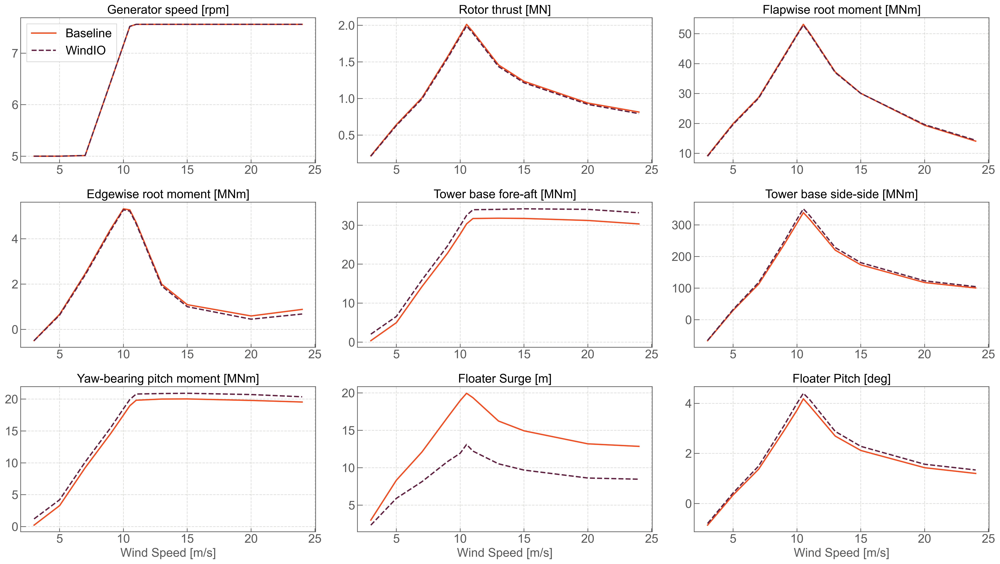

In [71]:
generate_subplots2(plot_attributes,descriptions_manual,descriptions_windio,df_turbine_curves_manual,df_turbine_curves_windio,
                  rows=3,cols=3,figsize=(7,4),savefile="General_performance_corrected_Blade_WINDIO_v02_4_1_1.png")

In [192]:
# generate_subplots(plot_attributes,descriptions_manual,df_turbine_curves_windio,df_turbine_curves_manual,
#                   rows=4,cols=3,figsize=(15,10),savefile="rotor_performance_FlexibleBlade_WINDIO_v03_1_1_1.png")

# Plotting

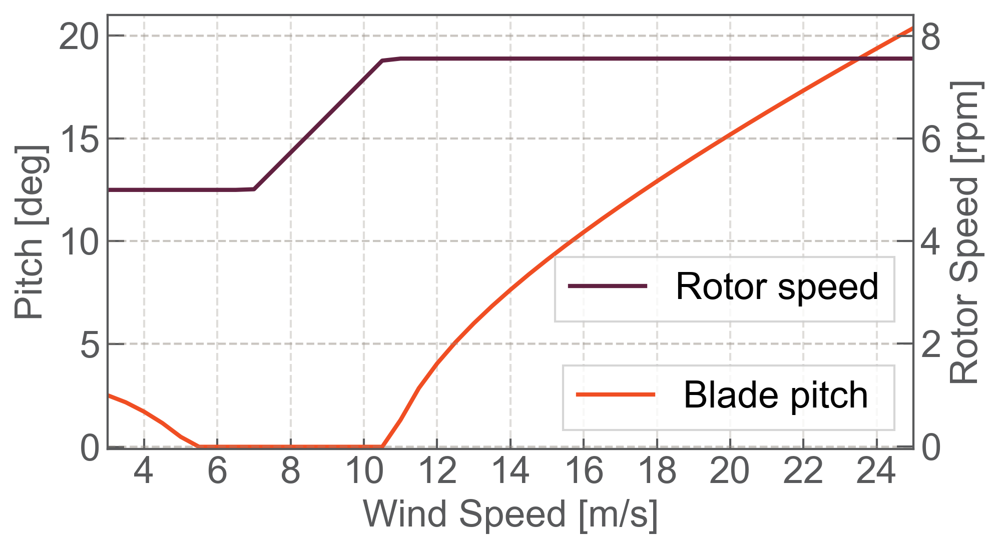

In [157]:

color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
# Wind speed values (index) as x-axis
wind_speed = df_rotor_curve.index

# Create the figure and primary y-axis
fig, ax1 = plt.subplots(figsize=(7, 4))

# Plot Pitch on the left y-axis
ax1.plot(wind_speed, df_rotor_curve["         Pitch [deg]"],color=color_cycle[0], label='Blade pitch ')
ax1.set_xlabel('Wind Speed [m/s]')
ax1.set_ylabel('Pitch [deg]',)
ax1.set_ylim(-0.1,21)
ax1.yaxis.set_major_locator(MultipleLocator(5))
#ax1.tick_params(axis='y')
ax1.legend(loc='lower right')#,bbox_to_anchor=(0,1)
#ax1.legend(loc="best")
ax1.set_xlim(3,25)
ax1.xaxis.set_major_locator(MultipleLocator(2))

# Create a twin y-axis for Rotor Speed
ax2 = ax1.twinx()
ax2.plot(wind_speed, df_rotor_curve["    Rotor Speed [rpm]"],color=color_cycle[1], label='Rotor speed')
ax2.set_ylabel('Rotor Speed [rpm]')
ax2.set_ylim(-0.05,8.41)
ax2.yaxis.set_major_locator(MultipleLocator(2))
#ax2.tick_params(axis='y', labelcolor='green')
ax2.legend(loc='lower right',bbox_to_anchor=(1.0,0.25))#,bbox_to_anchor=(0,0.88)
#ax2.legend(loc="best")


# Add a title and show the plot
#plt.title('Pitch and Rotor Speed vs Wind Speed')
#plt.xlim(3,25)
plt.tight_layout()
plt.show()


## Rotor performance

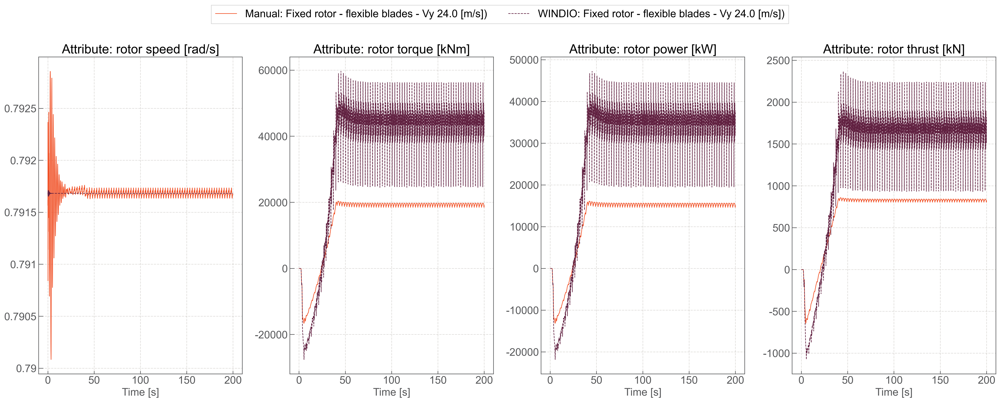

In [185]:
descriptions = {
    "rotor speed" : ' Rotor speed',  
    "rotor torque" : 'Aero rotor torque',
    "rotor power" : 'Aero rotor power',
    "rotor thrust" : 'Aero rotor thrust',
    
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2,
    prefix="1_1_1",
    plt_label = "Fixed rotor - flexible blades",
    font_size=18,
    wind_speeds = [24],#4,8,10.8,12,18,24
    ncols = 4,
    dim = (6,10),
    time_range = (0,200),
    linestyles= ("-","--"),
    linewidths=(1,1),
    #linealphas=(1,0.5),
    #consistent_colors=True,
    save = True,
)

## Blade tip

In [140]:
# #descriptions = {
#     "blade1 tip pos x" : ['State pos x  Mbdy:blade1 E-nr:   9 Z-rel:1.00 coo: blade1  blade 1 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],  
#     "blade1 tip pos y" : ['State pos y  Mbdy:blade1 E-nr:   9 Z-rel:1.00 coo: blade1  blade 1 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],
#     "blade1 tip pos z" : ['State pos z  Mbdy:blade1 E-nr:   9 Z-rel:1.00 coo: blade1  blade 1 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],
#     "blade2 tip pos x" : ['State pos x  Mbdy:blade2 E-nr:   9 Z-rel:1.00 coo: blade2  blade 2 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],  
#     "blade2 tip pos y" : ['State pos y  Mbdy:blade2 E-nr:   9 Z-rel:1.00 coo: blade2  blade 2 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],
#     "blade2 tip pos z" : ['State pos z  Mbdy:blade2 E-nr:   9 Z-rel:1.00 coo: blade2  blade 2 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],
#     "blade3 tip pos x" : ['State pos x  Mbdy:blade3 E-nr:   9 Z-rel:1.00 coo: blade3  blade 3 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],  
#     "blade3 tip pos y" : ['State pos y  Mbdy:blade3 E-nr:   9 Z-rel:1.00 coo: blade3  blade 3 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],
#     "blade3 tip pos z" : ['State pos z  Mbdy:blade3 E-nr:   9 Z-rel:1.00 coo: blade3  blade 3 tip pos',
#     'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  blade 1 tip pos'],
# }
# #plot_attributes_comparison(
#     results_dict1, 
#     results_dict2, 
#     descriptions, 
#     attr_mapping1,
#     attr_mapping2, 
#     prefix="1_1_1",
#     wind_speeds = [8],
#     ncols = 3,
#     dim = (6,3),
#     linewidths=(1,1),
#     #time_range=(50,100),
#     save = True
# )

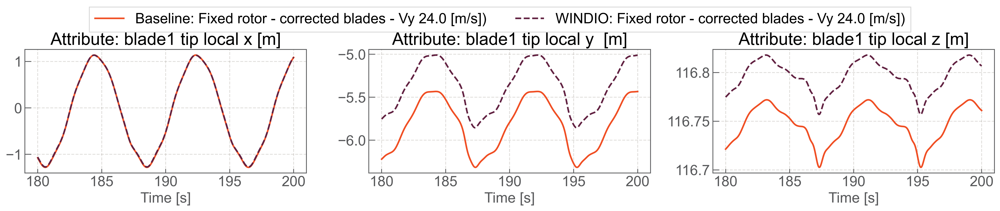

In [55]:
descriptions = {
    # "blade1 tip global x" : ['State pos x  Mbdy:blade1 E-nr:  33 Z-rel:1.00 coo: global  gl blade 1 tip pos', 
    #                         'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: global  gl blade 1 tip pos'],  
    # "blade1 tip global y " : ['State pos y  Mbdy:blade1 E-nr:  33 Z-rel:1.00 coo: global  gl blade 1 tip pos', 
    #                          'State pos y  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: global  gl blade 1 tip pos'],
    # "blade1 tip global z" : ['State pos z  Mbdy:blade1 E-nr:  33 Z-rel:1.00 coo: global  gl blade 1 tip pos', 
    #                         'State pos z  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: global  gl blade 1 tip pos'],
    # "blade2 tip global x" : ['State pos x  Mbdy:blade2 E-nr:  33 Z-rel:1.00 coo: global  gl blade 2 tip pos', 
    #                         'State pos x  Mbdy:blade2 E-nr:  49 Z-rel:1.00 coo: global  gl blade 2 tip pos'],  
    # "blade2 tip global y " : ['State pos y  Mbdy:blade2 E-nr:  33 Z-rel:1.00 coo: global  gl blade 2 tip pos', 
    #                          'State pos y  Mbdy:blade2 E-nr:  49 Z-rel:1.00 coo: global  gl blade 2 tip pos'],
    # "blade2 tip global z" : ['State pos z  Mbdy:blade2 E-nr:  33 Z-rel:1.00 coo: global  gl blade 2 tip pos', 
    #                         'State pos z  Mbdy:blade2 E-nr:  49 Z-rel:1.00 coo: global  gl blade 2 tip pos'],
    # "blade3 tip global x" : ['State pos x  Mbdy:blade3 E-nr:  33 Z-rel:1.00 coo: global  gl blade 3 tip pos', 
    #                         'State pos x  Mbdy:blade3 E-nr:  49 Z-rel:1.00 coo: global  gl blade 3 tip pos'],  
    # "blade3 tip global y " : ['State pos y  Mbdy:blade3 E-nr:  33 Z-rel:1.00 coo: global  gl blade 3 tip pos', 
    #                          'State pos y  Mbdy:blade3 E-nr:  49 Z-rel:1.00 coo: global  gl blade 3 tip pos'],
    # "blade3 tip global z" : ['State pos z  Mbdy:blade3 E-nr:  33 Z-rel:1.00 coo: global  gl blade 3 tip pos', 
    #                         'State pos z  Mbdy:blade3 E-nr:  49 Z-rel:1.00 coo: global  gl blade 3 tip pos'],
     "blade1 tip local x" : ['State pos x  Mbdy:blade1 E-nr:  33 Z-rel:1.00 coo: blade1  local blade 1 tip pos', 
                             'State pos x  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  local blade 1 tip pos'],  
     "blade1 tip local y " : ['State pos y  Mbdy:blade1 E-nr:  33 Z-rel:1.00 coo: blade1  local blade 1 tip pos', 
                              'State pos y  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  local blade 1 tip pos'],
     "blade1 tip local z" : ['State pos z  Mbdy:blade1 E-nr:  33 Z-rel:1.00 coo: blade1  local blade 1 tip pos', 
                             'State pos z  Mbdy:blade1 E-nr:  49 Z-rel:1.00 coo: blade1  local blade 1 tip pos'],
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="1_1_1",
    plt_label = "Fixed rotor - corrected blades",
    font_size=18,
    wind_speeds = [24],
    ncols = 3,
    dim = (6,4),
    linewidths=(2,2),
    time_range=(180,200),
    save = True
)

## blade misc

UnboundLocalError: cannot access local variable 'unit1' where it is not associated with a value

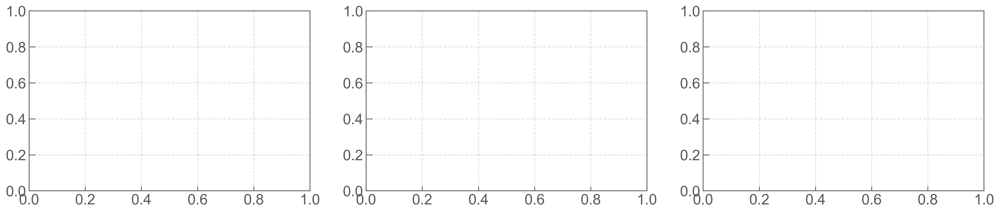

In [175]:
descriptions = {
    # "blade1 root Mx" : 'MomentMx Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root',  
    # "blade1 root My" : 'MomentMy Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root', 
    # "blade1 root Mz" : 'MomentMz Mbdy:blade1 nodenr:   1 coo: blade1  blade 1 root', 
    # "shaft main bearing Mx" : 'MomentMx Mbdy:shaft nodenr:   1 coo: shaft  main bearing',  
    # "shaft main bearing My" : 'MomentMy Mbdy:shaft nodenr:   1 coo: shaft  main bearing', 
    # "shaft main bearing Mz" : 'MomentMz Mbdy:shaft nodenr:   1 coo: shaft  main bearing', 
    # "tower yaw bearing Mx" : 'MomentMx Mbdy:tower nodenr:  10 coo: tower  tower yaw bearing',  
    # "tower yaw bearing My" : 'MomentMy Mbdy:tower nodenr:  10 coo: tower  tower yaw bearing', 
    # "tower yaw bearing Mz" : 'MomentMz Mbdy:tower nodenr:  10 coo: tower  tower yaw bearing', 
    "blade 1 angle of attack at r71.6m" : 'Angle of attack of blade   1 at radius  71.63',
    "blade 2 angle of attack at r71.6m" : 'Angle of attack of blade   2 at radius  71.63',
    "blade 3 angle of attack at r71.6m" : 'Angle of attack of blade   3 at radius  71.63',
    
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="1_1_1",
    plt_label = "Fixed rotor - flexible blades",
    font_size=18,
    wind_speeds = [10.8],
    ncols = 3,
    dim = (7,4),
    linewidths=(2,2),
    time_range=(180,200),
    save = True
)

## blade sectional loads

In [40]:
print(list_attribute_descriptions(attr_mappings['source1']))
print(list_attribute_descriptions(attr_mappings['source2']))

['shaft_rot angle', 'shaft_rot angle speed', ' Rotor speed', 'Aero rotor torque', 'Aero rotor power', 'Aero rotor thrust', 'Wind speed Vx of blade   1 at radius  71.63, global coo.', 'Angle of attack of blade   1 at radius  71.63', 'Angle of attack of blade   2 at radius  71.63', 'Angle of attack of blade   3 at radius  71.63', 'Cl of blade   1 at radius  71.63', 'Cl of blade   2 at radius  71.63', 'Cl of blade   3 at radius  71.63', 'Cd of blade   1 at radius  71.63', 'Cd of blade   2 at radius  71.63', 'Cd of blade   3 at radius  71.63', 'Aero force  Fx of blade   1 at radius   9.49, A.coo', 'Aero force  Fy of blade   1 at radius   9.49, A.coo', 'Aero force  Fz of blade   1 at radius   9.49, A.coo', 'Aero force  Fx of blade   1 at radius  49.24, A.coo', 'Aero force  Fy of blade   1 at radius  49.24, A.coo', 'Aero force  Fz of blade   1 at radius  49.24, A.coo', 'Aero force  Fx of blade   1 at radius 100.68, A.coo', 'Aero force  Fy of blade   1 at radius 100.68, A.coo', 'Aero force  F

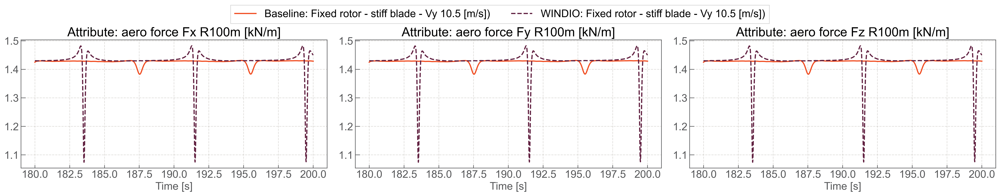

In [28]:
descriptions = {
    # "aero force Fx R10m" : 'Aero force  Fx of blade   1 at radius   9.49, A.coo',                          
    # "aero force Fy R10m" : 'Aero force  Fy of blade   1 at radius   9.49, A.coo',                            
    # "aero force Fz R10m" : 'Aero force  Fz of blade   1 at radius   9.49, A.coo', 
    # "aero force Fx R50m" : 'Aero force  Fx of blade   1 at radius  49.24, A.coo',                          
    # "aero force Fy R50m" : 'Aero force  Fy of blade   1 at radius  49.24, A.coo',                            
    # "aero force Fz R50m" : 'Aero force  Fz of blade   1 at radius  49.24, A.coo', 
    "aero force Fx R100m" : 'Aero force  Fx of blade   1 at radius 100.68, A.coo',                          
    "aero force Fy R100m" : 'Aero force  Fx of blade   1 at radius 100.68, A.coo',                            
    "aero force Fz R100m" : 'Aero force  Fx of blade   1 at radius 100.68, A.coo',
                            
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="1_3_1",
    plt_label = "Fixed rotor - stiff blade",
    font_size=18,
    wind_speeds = [10.5],
    ncols = 3,
    dim = (8,5),
    linewidths=(2,2),
    time_range=(180,200),
    save = True
)

In [165]:
print(list_attribute_descriptions(attr_mappings['source1']))
print(list_attribute_descriptions(attr_mappings['source2']))

['shaft_rot angle', 'shaft_rot angle speed', ' Rotor speed', 'Aero rotor torque', 'Aero rotor power', 'Aero rotor thrust', 'Wind speed Vx of blade   1 at radius  71.63, global coo.', 'Angle of attack of blade   1 at radius  71.63', 'Angle of attack of blade   2 at radius  71.63', 'Angle of attack of blade   3 at radius  71.63', 'Cl of blade   1 at radius  71.63', 'Cl of blade   2 at radius  71.63', 'Cl of blade   3 at radius  71.63', 'Cd of blade   1 at radius  71.63', 'Cd of blade   2 at radius  71.63', 'Cd of blade   3 at radius  71.63', 'Aero force  Fx of blade   1 at radius   9.49, A.coo', 'Aero force  Fy of blade   1 at radius   9.49, A.coo', 'Aero force  Fz of blade   1 at radius   9.49, A.coo', 'Aero force  Fx of blade   1 at radius  49.24, A.coo', 'Aero force  Fy of blade   1 at radius  49.24, A.coo', 'Aero force  Fz of blade   1 at radius  49.24, A.coo', 'Aero force  Fx of blade   1 at radius 100.68, A.coo', 'Aero force  Fy of blade   1 at radius 100.68, A.coo', 'Aero force  F

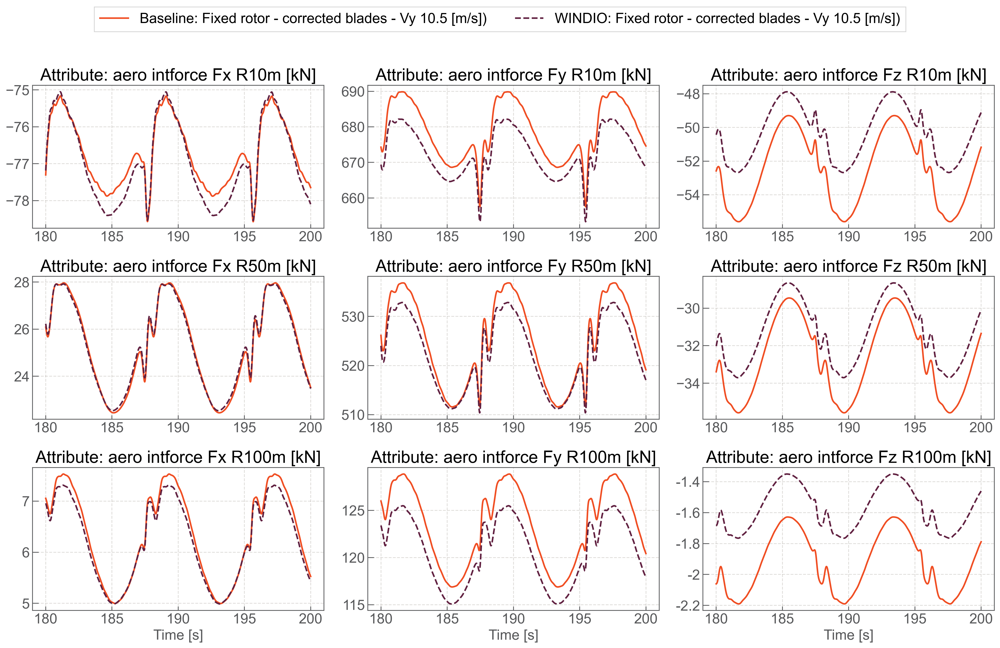

In [56]:
descriptions = {
    "aero intforce Fx R10m" : 'Aero int. force  Fx of blade   1 at radius  10.00, local ae coo.',                          
    "aero intforce Fy R10m" : 'Aero int. force  Fy of blade   1 at radius  10.00, local ae coo.',                            
    "aero intforce Fz R10m" : 'Aero int. force  Fz of blade   1 at radius  10.00, local ae coo.', 
    "aero intforce Fx R50m" : 'Aero int. force  Fx of blade   1 at radius  50.00, local ae coo.',                          
    "aero intforce Fy R50m" : 'Aero int. force  Fy of blade   1 at radius  50.00, local ae coo.',                            
    "aero intforce Fz R50m" : 'Aero int. force  Fz of blade   1 at radius  50.00, local ae coo.', 
    "aero intforce Fx R100m" : 'Aero int. force  Fx of blade   1 at radius 100.00, local ae coo.',                          
    "aero intforce Fy R100m" : 'Aero int. force  Fy of blade   1 at radius 100.00, local ae coo.',                            
    "aero intforce Fz R100m" : 'Aero int. force  Fz of blade   1 at radius 100.00, local ae coo.', 
                            
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="1_1_1",
    plt_label = "Fixed rotor - corrected blades", # change
    font_size=18,
    wind_speeds = [10.5],
    ncols = 3,
    dim = (6,4),
    linewidths=(2,2),
    time_range=(180,200),
    save = True
)

## blade position

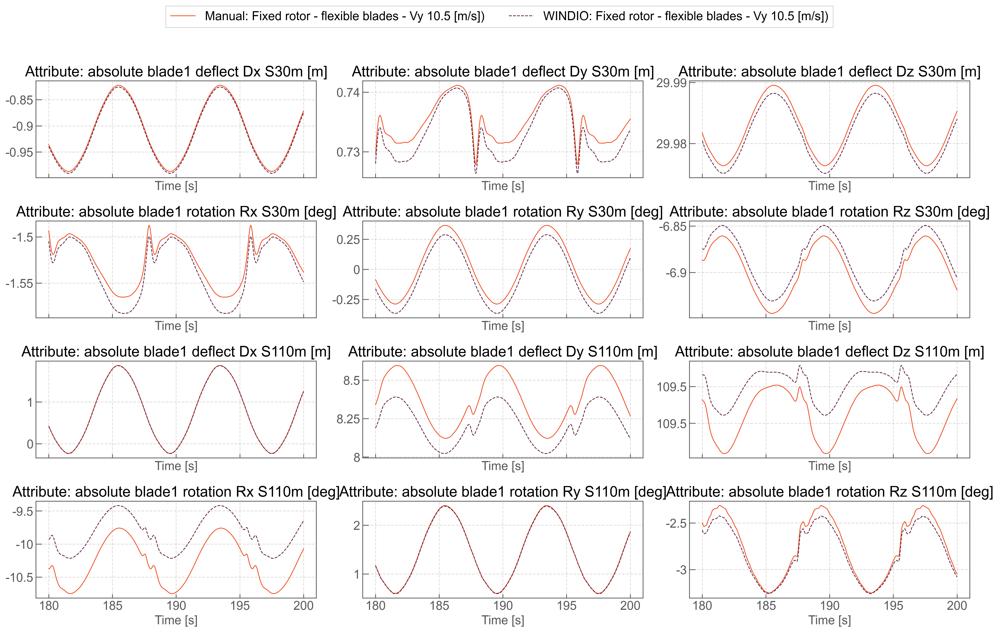

In [298]:
descriptions = {
    "absolute blade1 deflect Dx S30m" : 'absolute Deflection blade1 Dx Mbdy:blade1 s=  30.00[m] s/S=   0.26 coo: blade1 center:c2def',                          
    "absolute blade1 deflect Dy S30m" : 'absolute Deflection blade1 Dy Mbdy:blade1 s=  30.00[m] s/S=   0.26 coo: blade1 center:c2def',                            
    "absolute blade1 deflect Dz S30m" : 'absolute Deflection blade1 Dz Mbdy:blade1 s=  30.00[m] s/S=   0.26 coo: blade1 center:c2def', 
    "absolute blade1 rotation Rx S30m" : 'absolute Rotation blade1 Rx Mbdy:blade1 s=  30.00[m] s/S=   0.26 coo: blade1 center:c2def',                          
    "absolute blade1 rotation Ry S30m" : 'absolute Rotation blade1 Ry Mbdy:blade1 s=  30.00[m] s/S=   0.26 coo: blade1 center:c2def',                            
    "absolute blade1 rotation Rz S30m" : 'absolute Rotation blade1 Rz Mbdy:blade1 s=  30.00[m] s/S=   0.26 coo: blade1 center:c2def', 
    "absolute blade1 deflect Dx S110m" : 'absolute Deflection blade1 Dx Mbdy:blade1 s= 110.00[m] s/S=   0.94 coo: blade1 center:c2def',                          
    "absolute blade1 deflect Dy S110m" : 'absolute Deflection blade1 Dy Mbdy:blade1 s= 110.00[m] s/S=   0.94 coo: blade1 center:c2def',                            
    "absolute blade1 deflect Dz S110m" : 'absolute Deflection blade1 Dz Mbdy:blade1 s= 110.00[m] s/S=   0.94 coo: blade1 center:c2def', 
    "absolute blade1 rotation Rx S110m" : 'absolute Rotation blade1 Rx Mbdy:blade1 s= 110.00[m] s/S=   0.94 coo: blade1 center:c2def',                          
    "absolute blade1 rotation Ry S110m" : 'absolute Rotation blade1 Ry Mbdy:blade1 s= 110.00[m] s/S=   0.94 coo: blade1 center:c2def',                            
    "absolute blade1 rotation Rz S110m" : 'absolute Rotation blade1 Rz Mbdy:blade1 s= 110.00[m] s/S=   0.94 coo: blade1 center:c2def',
                            
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="1_1_1",
    plt_label = "Fixed rotor - flexible blades", #change
    font_size=16,
    wind_speeds = [10.5],
    ncols = 3,
    dim = (6,3),
    linewidths=(1,1),
    time_range=(180,200),
    save = True
)

## Floater position

In [ ]:
#     "Surge" :  'State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos', 
#        "Pitch" :  'absolute Rotation global Rz Mbdy:main_column s=   0.00[m] s/S=   0.00 coo: global center:c2def',       

In [ ]:
['ESYS floater SENSOR            1','ESYS floater SENSOR            2','ESYS floater SENSOR            3']

In [ ]:
['ESYS floater SENSOR            6','absolute Rotation global Ry Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def']

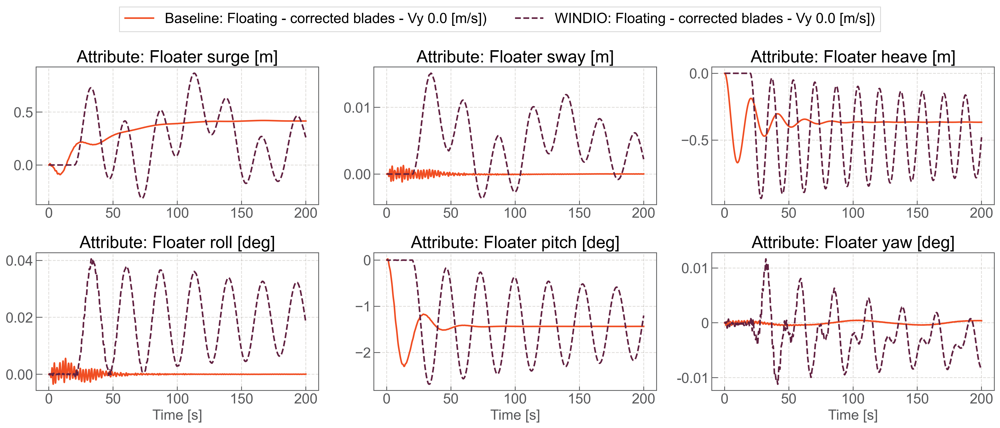

In [68]:
descriptions = {
    "Floater surge [m]" : ['ESYS floater SENSOR            1','State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'], #: [-0.41,-2.21]},                          
    "Floater sway [m]"  : ['ESYS floater SENSOR            2','State pos x  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'], #: [0,0]},                                    
    "Floater heave [m]" : ['ESYS floater SENSOR            3','State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'], #: [-0.36,-0.51]},      
    "Floater roll [deg]"  : ['ESYS floater SENSOR            4',"rotx"], #: [0,0.19]},                          
    "Floater pitch [deg]" : ['ESYS floater SENSOR            5',"roty"], #: [-1.43,-2.91]},                            
    "Floater yaw [deg]"   : ['ESYS floater SENSOR            6','absolute Rotation global Ry Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def'], #: [0,0]},
}
plot_attributes_comparison3(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="4_1_1",
    plt_label = "Floating - corrected blades", # change
    font_size=18,
    wind_speeds = [0],
    ncols = 3,
    dim = (6,4),
    linewidths=(2,2),
    time_range=(0,200),
    save = True
)

In [364]:
# descriptions = {
#     # "floater surge" : ['ESYS floater SENSOR            1','State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'],                          
#     # "floater sway"  : ['ESYS floater SENSOR            2','State pos x  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'],                                    
#     # "flaoter heave" : ['ESYS floater SENSOR            3','State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'],    
#     "Floater surge [m]" : ['ESYS floater SENSOR            1',-0.0,'absolute Deflection global Dy Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def', -0], #: [-0.41,-2.21]},                          
#     "Floater sway [m]"  : ['ESYS floater SENSOR            2',0,'absolute Deflection global Dx Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def', 0.00], #: [0,0]},                                    
#     "Floater heave [m]" : ['ESYS floater SENSOR            3',-0.0,'absolute Deflection global Dz Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def', -0.0], #: [-0.36,-0.51]},      
#     "Floater roll [deg]"  : ['ESYS floater SENSOR            4',0,'absolute Rotation global Ry Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def',   0.0], #: [0,0.19]},                          
#     "Floater pitch [deg]" : ['ESYS floater SENSOR            5',-0,'absolute Rotation global Rz Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def',   -0], #: [-1.43,-2.91]},                            
#     "Floater yaw [deg]"   : ['ESYS floater SENSOR            6',0,'absolute Rotation global Rx Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def',   0.0], #: [0,0]},
                            
# }
# plot_attributes_comparison2(
#     results_dict1, 
#     results_dict2, 
#     descriptions, 
#     attr_mapping1,
#     attr_mapping2, 
#     prefix="4_1_1",
#     plt_label = "Floating system", # change
#     font_size=18,
#     wind_speeds = [10.5],
#     ncols = 3,
#     dim = (6,4),
#     linewidths=(3,3),
#     time_range=(0,200),
#     save = True
# )

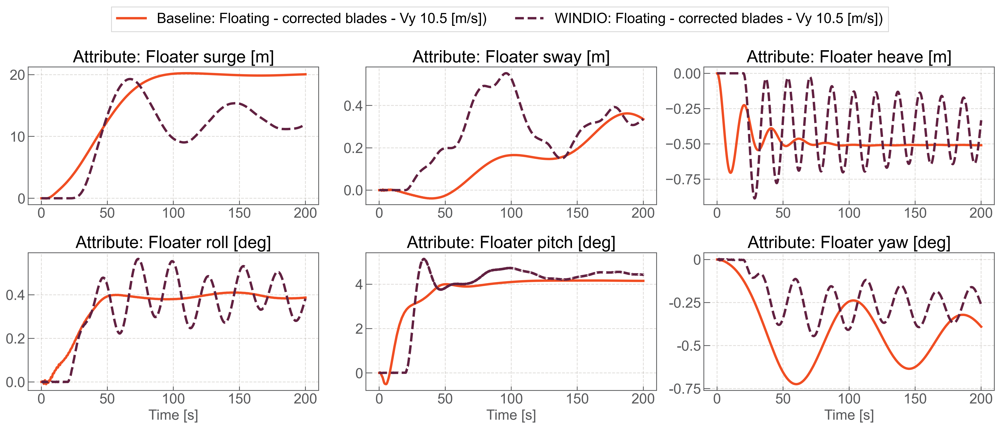

In [69]:
descriptions = {
    # "floater surge" : ['ESYS floater SENSOR            1','State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'],                          
    # "floater sway"  : ['ESYS floater SENSOR            2','State pos x  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'],                                    
    # "flaoter heave" : ['ESYS floater SENSOR            3','State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'],    
    "Floater surge [m]" : ['ESYS floater SENSOR            1','State pos y  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'], #: [-0.41,-2.21]},                          
    "Floater sway [m]"  : ['ESYS floater SENSOR            2','State pos x  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'], #: [0,0]},                                    
    "Floater heave [m]" : ['ESYS floater SENSOR            3','State pos z  Mbdy:main_column E-nr:   1 Z-rel:0.00 coo: global  gl main_col 1 main_col pos'], #: [-0.36,-0.51]},      
    "Floater roll [deg]"  : ['ESYS floater SENSOR            4',"rotx"], #: [0,0.19]},                          
    "Floater pitch [deg]" : ['ESYS floater SENSOR            5',"roty"], #: [-1.43,-2.91]},                            
    "Floater yaw [deg]"   : ['ESYS floater SENSOR            6','absolute Rotation global Ry Mbdy:main_column s=  20.00[m] s/S=   0.57 coo: global center:c2def'], #: [0,0]},
                            
}
plot_attributes_comparison3(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="4_1_1",
    plt_label = "Floating - corrected blades", # change
    font_size=18,
    wind_speeds = [10.5],
    ncols = 3,
    dim = (6,4),
    linewidths=(3,3),
    time_range=(0,200),
    save = True
)

## Mooring lines

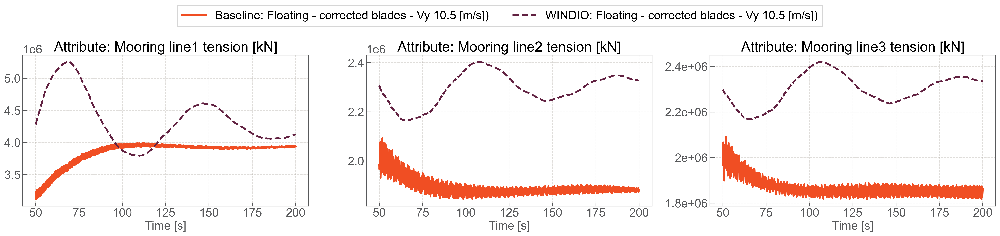

In [75]:
descriptions = {   
    "Mooring line1 tension [kN]" : ['ESYS line1 SENSOR           84','ESYS line1 SENSOR           84'],  
    "Mooring line2 tension [kN]" : ['ESYS line2 SENSOR           84','ESYS line2 SENSOR           84'], 
    "Mooring line3 tension [kN]" : ['ESYS line3 SENSOR           84','ESYS line3 SENSOR           84'],                                           
}
plot_attributes_comparison(
    results_dict1, 
    results_dict2, 
    descriptions, 
    attr_mapping1,
    attr_mapping2, 
    prefix="4_1_1",
    plt_label = "Floating - corrected blades", # change
    font_size=20,
    wind_speeds = [10.5],
    ncols = 3,
    dim = (8,6),
    linewidths=(3,3),
    time_range=(50,200),
    save = True
)